Copy dataset to current working directory in order to speed up data access

In [ ]:
!git clone https://github.com/DavideLusuardi/dataset.git

Cloning into 'dataset'...
remote: Enumerating objects: 32674, done.
remote: Counting objects: 100% (32674/32674), done.
remote: Compressing objects: 100% (32645/32645), done.
remote: Total 32674 (delta 29), reused 32674 (delta 29), pack-reused 0
Receiving objects: 100% (32674/32674), 68.93 MiB | 30.11 MiB/s, done.
Resolving deltas: 100% (29/29), done.
Checking out files: 100% (34917/34917), done.


In [ ]:
dataset_path = "dataset"

Import modules

In [ ]:
import csv
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import pandas as pd
import time
import torch
import torch.nn.functional as F
import torchvision
from skimage import io
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms
from torch.utils.tensorboard import SummaryWriter
from typing import Dict, Set, List, Tuple

Define hardware on which computation will be performed

In [ ]:
device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")

# Define neural network (variation of ResNet)

The backbone of the network is a ResNet pretrained on the Imagenet dataset. The final convolutional layer is flattened and fed as input to fully connected classifiers, there is a classifier for each attribute to predict.

The constructor takes as parameter an array containing the number of classes to predict for each attribute (```
output_lengths
```) and the number of different person id (```
person_ids_number
``` ).

In [ ]:
class SecurityNet(nn.Module):

  def __init__(self, output_lengths: List[int], person_ids_number: int):
    super(SecurityNet, self).__init__()
    pretrained_resnet = torch.hub.load('pytorch/vision', 'resnet50', pretrained=True)
    self.num_features = pretrained_resnet.fc.in_features
    pretrained_resnet.fc = nn.Identity()
    self.backbone = pretrained_resnet

    self.id_classifier = nn.Sequential(
        nn.Linear(self.num_features + len(output_lengths), person_ids_number)
    )

    self.classifiers = nn.ModuleList([nn.Sequential(
      nn.Dropout(p=0.4),
      nn.Linear(self.num_features, 128),
      nn.BatchNorm1d(128),
      nn.LeakyReLU(0.1),
      nn.Linear(128, output_length)
    ) for output_length in output_lengths])

  def forward(self, x: torch.Tensor) -> Tuple[List[torch.Tensor], torch.Tensor, torch.Tensor]:
    resnet_features = self.backbone(x)
    flattened_features = torch.flatten(resnet_features, 1)

    outputs_classifier_results = []
    for classifier in self.classifiers:
      outputs_classifier_results.append(classifier(flattened_features))

    attributes = torch.stack([output.max(1)[1] for output in outputs_classifier_results])
    attributes = attributes.swapaxes(0, 1)
    attributes_and_features = torch.cat((flattened_features, attributes), 1)
    output_id = self.id_classifier(attributes_and_features)

    return outputs_classifier_results, output_id, flattened_features

**Import annotation_train.csv with pandas**

The annotations are rearranged in a dictionary where each entry is a person id and its value is a dictionary of all the possible labels as entry and its values as value

The up colors and down colors are rearranged in a one hot encoding manner

In [ ]:
annotation_train = pd.read_csv(f'{dataset_path}/annotations_train.csv')
annotation_dict = {}
for row_idx, row in enumerate(annotation_train.id):
  if annotation_train.upblack[row_idx] == 2:
    up_value = 0
  elif annotation_train.upwhite[row_idx] == 2:
    up_value = 1
  elif annotation_train.upred[row_idx] == 2:
    up_value = 2
  elif annotation_train.uppurple[row_idx] == 2:
    up_value = 3
  elif annotation_train.upyellow[row_idx] == 2:
    up_value = 4
  elif annotation_train.upgray[row_idx] == 2:
    up_value = 5
  elif annotation_train.upblue[row_idx] == 2:
    up_value = 6
  elif annotation_train.upgreen[row_idx] == 2:
    up_value = 7
  else:  # the case in which there are multiple colors
    up_value = 8
  
  if annotation_train.downblack[row_idx] == 2:
    down_value = 0
  elif annotation_train.downwhite[row_idx] == 2:
    down_value = 1
  elif annotation_train.downpink[row_idx] == 2:
    down_value = 2
  elif annotation_train.downpurple[row_idx] == 2:
    down_value = 3
  elif annotation_train.downyellow[row_idx] == 2:
    down_value = 4
  elif annotation_train.downgray[row_idx] == 2:
    down_value = 5
  elif annotation_train.downblue[row_idx] == 2:
    down_value = 6
  elif annotation_train.downgreen[row_idx] == 2:
    down_value = 7
  elif annotation_train.downbrown[row_idx] == 2:
    down_value = 8
  else:  # the case in which there are multiple colors
    down_value = 9

  annotation_dict[row] = {
      "age": annotation_train.age[row_idx] - 1,
      "gender": annotation_train.gender[row_idx] - 1,
      "hair": annotation_train.hair[row_idx] - 1,
      "up": annotation_train.up[row_idx] - 1,
      "down": annotation_train.down[row_idx] - 1,
      "clothes": annotation_train.clothes[row_idx] - 1,
      "hat": annotation_train.hat[row_idx] - 1,
      "backpack": annotation_train.backpack[row_idx] - 1,
      "bag": annotation_train.bag[row_idx] - 1,
      "handbag": annotation_train.handbag[row_idx] - 1,
      "up_color": up_value,
      "down_color": down_value
  }

attributes = ["age", "gender", "hair", "up", "down", "clothes", "hat", "backpack", "bag", "handbag", "up_color", "down_color"]
person_ids_number = len(annotation_dict)
print(f"number of ids: {person_ids_number}")
output_lengths = []
for key in annotation_dict[annotation_train.id[0]]:
  output_lengths.append(len(set([annotation_dict[item][key] for item in annotation_dict])))
print(f"output_lengths: {output_lengths}")

number of ids: 751
output_lengths: [4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 9, 10]


We create an instance of NeuralNetwork, and move it to the device, and print its structure.

In [ ]:
model = SecurityNet(output_lengths, person_ids_number).to(device)
print(model)

Using cache found in /root/.cache/torch/hub/pytorch_vision_master


SecurityNet(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
     

**Create Dataset**

A dataset is created in order to get items properly.

A set of transformation that will be applied to the training set only are also specified.

In [ ]:
class securityDataset(Dataset):
  def __init__(self, images, person_ids, labels_dict, map_id2index, transforms=None, test=False):
    self.images = images
    self.person_ids = person_ids
    self.labels_dict = labels_dict
    self.transforms = transforms
    self.test = test
    self.map_id2index = map_id2index

  def __len__(self):
    return len(self.images)

  def __getitem__(self, index):
    image = self.images[index]
    person_id = self.person_ids[index]
    if self.test:
      return image, person_id

    person_id_index = self.map_id2index[person_id]
    attrs = torch.Tensor([self.labels_dict[person_id][key] for key in attributes]).long()
    
    if self.transforms is not None and np.random.randint(4) % 4 != 0:  # 1/4 of times don't perform tranformations
      image=self.transforms(image)
    else:
      transform=transforms.Compose([
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      ])
      image = transform(image)
    
    return image, attrs, person_id, person_id_index


train_transforms = transforms.Compose([
  transforms.RandomHorizontalFlip(p=0.5),
  transforms.RandomPerspective(distortion_scale=0.1, p=0.2),
  transforms.RandomRotation(25),
  transforms.RandomErasing(p=0.5, scale=(0.1, 0.3)),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

Load annotated, query and test images. When splitting annotated images into training and validation, images of the same person are either in the train or in the validation dataset.

In [ ]:
def load_train_images(folder):
    images = dict()
    for filename in os.listdir(folder):
      img = io.imread(os.path.join(folder,filename))
      img = img.swapaxes(1, 2)
      img = img.swapaxes(0, 1)
      if img is not None:
        person_id = int(filename.split("_")[0])
        if person_id not in images:
          images[person_id] = list()
        images[person_id].append(torch.tensor(img, dtype=torch.float))

    return images

In [ ]:
def load_test_images(folder):
    images = dict()
    for filename in os.listdir(folder):
      img = io.imread(os.path.join(folder, filename))
      img = img.swapaxes(1, 2)
      img = img.swapaxes(0, 1)
      if img is not None:
        images[filename] = torch.tensor(img, dtype=torch.float)

    return images

In [ ]:
def split_dataset(img_dataset, training_ratio):
  if training_ratio < 0 or training_ratio > 1:
    raise ValueError(f"validation_ratio is not between 0 and 1")

  img_dataset_size = sum(len(imgs) for imgs in img_dataset.values())
  train_size = int(training_ratio * img_dataset_size)

  training_data = list()
  validation_data = list()
  total_img = 0
  for id in list(img_dataset.keys()):
    imgs = img_dataset[id]
    if total_img <= train_size:
      training_data += [(img, id) for img in imgs]
    else:
      validation_data += [(img, id) for img in imgs]
    
    total_img += len(imgs)

  return training_data, validation_data

Split train images into train and validation dataset: all images of the same person are either in the train or in the validation dataset

In [ ]:
train_img = load_train_images(f"{dataset_path}/train")
train_data, val_data = split_dataset(train_img, training_ratio=0.8)
print(f"Annotated images splitted in {len(train_data)} train images and {len(val_data)} validation images")

map_id2index = dict([(id, index) for index, id in enumerate(train_img.keys())])
train_map_id2index = {id:i for i,id in enumerate(set([id for img, id in train_data]))}
val_map_id2index = {id:i for i,id in enumerate(set([id for img, id in val_data]))}

Annotated images splitted in 10417 train images and 2572 validation images


In [ ]:
query_img = load_test_images(f"{dataset_path}/queries")
test_img = load_test_images(f"{dataset_path}/test")
print(f"Loaded query images: {len(query_img)}")
print(f"Loaded test images: {len(test_img)}")

Loaded query images: 2248
Loaded test images: 19679


**Instanitate datasets and create dataloaders**

In [ ]:
batch_size = 128
training_data = securityDataset([img for (img, id) in train_data], [id for (img, id) in train_data], annotation_dict, train_map_id2index, transforms=train_transforms)
validation_data = securityDataset([img for (img, id) in val_data], [id for (img, id) in val_data], annotation_dict, val_map_id2index, transforms=None)
train_loader = DataLoader(training_data, batch_size=batch_size, shuffle=True, num_workers=2, drop_last=False)
val_loader = DataLoader(validation_data, batch_size=batch_size, shuffle=True, num_workers=2, drop_last=False)

query_data = securityDataset([query_img[filename] for filename in query_img], [filename for filename in query_img], None, None, transforms=None, test=True)
test_data = securityDataset([test_img[filename] for filename in test_img], [filename for filename in test_img], None, None, transforms=None, test=True)
query_loader = DataLoader(query_data, batch_size=batch_size, shuffle=True, num_workers=2, drop_last=False)
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=True, num_workers=2, drop_last=False)

## Loss/cost function
The task is classification with multiple classes, thus a proper loss could be a cross-entropy with softmax.

In [ ]:
def get_id_cost_function():
  cost_function = torch.nn.CrossEntropyLoss()
  return cost_function

def get_attr_cost_function():
  cost_function = torch.nn.CrossEntropyLoss()
  return cost_function

## Optimizer
An optimizer function is defined, we use different learning rates for the backbone and for the classifiers.

In [ ]:
def get_optimizer(net):

  classifier_params = list()
  for name, p in net.named_parameters():
    if not name.startswith('backbone'):
      classifier_params.append(p)

  optimizer = torch.optim.SGD([
              {'params': net.backbone.parameters(), 'lr': 0.01},
              {'params': classifier_params, 'lr': 0.05},
          ], momentum=0.9, weight_decay=0.0001, nesterov=True)

  return optimizer

In [ ]:
def get_scheduler(optimizer):
  scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)
  return scheduler

**Train and test functions**

Create a training and test functions. Both of them must:

1.  Loop over the data exploiting the dataloader
2.  Forward the data through the network
3.  Comparing the output with the target labels for computing the loss and the accuracy.

Additionally, during training we:

1.  Compute the gradient with the backward pass (`loss.backward()`)
2.  Use the optimizer to update the weights (`optimizer.step()`)
3.  Clean the gradient of the weights in order to not accumulating it (`optimizer.zero_grad()`)

In [ ]:
def test(net, data_loader, attr_cost_function, id_cost_function, device):
  samples = 0.
  cumulative_loss = 0.
  cumulative_accuracy = 0.
  id_accuracy = 0.
  attr_accuracy = 0.
  net.eval()
  with torch.no_grad():
    for inputs, targets, ids, id_indexes in data_loader:
      inputs = inputs.to(device)
      targets = targets.to(device)
      ids = ids.to(device)
      id_indexes = id_indexes.to(device)

      outputs, output_ids, ftrs = net(inputs)
      output_ids.to(device)
      targets = torch.transpose(targets, 0, 1)

      attr_loss = None
      for target_index, target in enumerate(targets):
        output = outputs[target_index].to(device)
        loss = attr_cost_function(output, target)
        if attr_loss is None:
          attr_loss = loss
        else:
          attr_loss += loss
      
        _, predicted = output.max(1)
        attr_accuracy += predicted.eq(target).sum().item() / targets.shape[0]

      id_loss = id_cost_function(output_ids, id_indexes)
      alpha = 0.1
      weighted_sum_loss = (1 - alpha) * attr_loss / len(outputs) + alpha * id_loss
      cumulative_loss += weighted_sum_loss.item()

      samples += inputs.shape[0]
      _, predicted = output_ids.max(1)
      id_accuracy += predicted.eq(id_indexes).sum().item()

  id_accuracy = id_accuracy/samples*100
  attr_accuracy = attr_accuracy/samples*100
  return cumulative_loss/samples, id_accuracy, attr_accuracy


def train(net, data_loader, optimizer, attr_cost_function, id_cost_function, device):
  samples = 0.
  cumulative_loss = 0.
  cumulative_accuracy = 0.
  id_accuracy = 0.
  attr_accuracy = 0.
  net.train()
  for inputs, targets, ids, id_indexes in data_loader:
    inputs = inputs.to(device)
    targets = targets.to(device)
    ids = ids.to(device)
    id_indexes = id_indexes.to(device)

    outputs, output_ids, ftrs = net(inputs)
    output_ids.to(device)
    targets = torch.transpose(targets, 0, 1)

    attr_loss = None
    for target_index, target in enumerate(targets):
      output = outputs[target_index].to(device)
      loss = attr_cost_function(output, target)
      if attr_loss is None:
        attr_loss = loss
      else:
        attr_loss += loss
    
      _, predicted = output.max(1)
      attr_accuracy += predicted.eq(target).sum().item() / targets.shape[0]

    id_loss = id_cost_function(output_ids, id_indexes)
    alpha = 0.1
    weighted_sum_loss = (1 - alpha) * attr_loss / len(outputs) + alpha * id_loss
    cumulative_loss += weighted_sum_loss.item()

    weighted_sum_loss.backward()
    optimizer.step()
    optimizer.zero_grad()

    samples += inputs.shape[0]
    _, predicted = output_ids.max(1)
    id_accuracy += predicted.eq(id_indexes).sum().item()

  id_accuracy = id_accuracy/samples*100
  attr_accuracy = attr_accuracy/samples*100
  return cumulative_loss/samples, id_accuracy, attr_accuracy

## Wrapping everything up

Now that the test and train function are defined a main function is created to perform training and validation.

The main initialy computes accuracy on train and validation dataset before training, after that execute the train and the test func for each epoch. After each epoch finishes the current loss and accuracy is logged for both training and validation.

In [ ]:
def log_values(writer, step, loss, accuracy_id, accuracy_attr, prefix):
  writer.add_scalar(f"{prefix}/loss", loss, step)
  writer.add_scalar(f"{prefix}/accuracy_id", accuracy_id, step)
  writer.add_scalar(f"{prefix}/accuracy_attr", accuracy_attr, step)

def main(device, epochs=10):  
  writer = SummaryWriter(log_dir="runs/exp1")
  start_execution = time.time()
  optimizer = get_optimizer(model)
  scheduler = get_scheduler(optimizer)
  attr_cost_function = get_attr_cost_function()
  id_cost_function = get_id_cost_function()

  train_loss, train_id_accuracy, train_attr_accuracy = test(model, train_loader, attr_cost_function, id_cost_function, device)
  val_loss, val_id_accuracy, val_attr_accuracy = test(model, val_loader, attr_cost_function, id_cost_function, device)

  log_values(writer, -1, train_loss, train_id_accuracy, train_attr_accuracy, "Train")
  log_values(writer, -1, val_loss, val_id_accuracy, val_attr_accuracy, "Validation")

  print('\t Training loss {:.5f}, Training id accuracy {:.3f}, Training attr accuracy {:.3f}'.format(train_loss, train_id_accuracy, train_attr_accuracy))
  print('\t Validation loss {:.5f}, Validation id accuracy {:.3f}, Validation attr accuracy {:.3f}'.format(val_loss, val_id_accuracy, val_attr_accuracy))
  print('------------------------------------------------------------')

  for e in range(epochs):
    train_loss, train_id_accuracy, train_attr_accuracy = train(model, train_loader, optimizer, attr_cost_function, id_cost_function, device)
    val_loss, val_id_accuracy, val_attr_accuracy = test(model, val_loader, attr_cost_function, id_cost_function, device)

    log_values(writer, e, train_loss, train_id_accuracy, train_attr_accuracy, "Train")
    log_values(writer, e, val_loss, val_id_accuracy, val_attr_accuracy, "Validation")

    print('Epoch: {:d}'.format(e+1))
    print('\t Training loss {:.5f}, Training id accuracy {:.3f}, Training attr accuracy {:.3f}'.format(train_loss, train_id_accuracy, train_attr_accuracy))
    print('\t Validation loss {:.5f}, Validation id accuracy {:.3f}, Validation attr accuracy {:.3f}'.format(val_loss, val_id_accuracy, val_attr_accuracy))
    print('------------------------------------------------------------')

    scheduler.step()

  print('After training:')
  train_loss, train_id_accuracy, train_attr_accuracy = test(model, train_loader, attr_cost_function, id_cost_function, device)
  val_loss, val_id_accuracy, val_attr_accuracy = test(model, val_loader, attr_cost_function, id_cost_function, device)

  log_values(writer, epochs, train_loss, train_id_accuracy, train_attr_accuracy, "Train")
  log_values(writer, epochs, val_loss, val_id_accuracy, val_attr_accuracy, "Validation")

  print('\t Training loss {:.5f}, Training id accuracy {:.3f}, Training attr accuracy {:.3f}'.format(train_loss, train_id_accuracy, train_attr_accuracy))
  print('\t Validation loss {:.5f}, Validation id accuracy {:.3f}, Validation attr accuracy {:.3f}'.format(val_loss, val_id_accuracy, val_attr_accuracy))
  print('------------------------------------------------------------')

  writer.close()

In [ ]:
! rm -r runs

The network gets trained through the main function and then the learned weights are stored.

In [ ]:
main(device=device, epochs=10)
trained_security_net_path = "test_trained_security_net.pth"
torch.save(model.state_dict(), trained_security_net_path)

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594: UserWarning: torch.lstsq is deprecated in favor of torch.linalg.lstsq and will be removed in a future PyTorch release.
torch.linalg.lstsq has reversed arguments and does not return the QR decomposition in the returned tuple (although it returns other information about the problem).
To get the qr decomposition consider using torch.linalg.qr.
The returned solution in torch.lstsq stored the residuals of the solution in the last m - n columns of the returned value whenever m > n. In torch.linalg.lstsq, the residuals in the field 'residuals' of the returned named tuple.
The unpacking of the solution, as in
X, _ = torch.lstsq(B, A).solution[:A.size(1)]
should be replaced with
X = torch.linalg.lstsq(A, B).solution (Triggered internally at  /pytorch/aten/src/ATen/LegacyTHFunctionsCPU.cpp:389.)
  res = torch.lstsq(b_matrix, a_matrix)[0]
/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594

	 Training loss 1.15725, Training id accuracy 0.125, Training attr accuracy 47.638
	 Validation loss 1.29153, Validation id accuracy 0.000, Validation attr accuracy 46.394
------------------------------------------------------------


/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594: UserWarning: torch.lstsq is deprecated in favor of torch.linalg.lstsq and will be removed in a future PyTorch release.
torch.linalg.lstsq has reversed arguments and does not return the QR decomposition in the returned tuple (although it returns other information about the problem).
To get the qr decomposition consider using torch.linalg.qr.
The returned solution in torch.lstsq stored the residuals of the solution in the last m - n columns of the returned value whenever m > n. In torch.linalg.lstsq, the residuals in the field 'residuals' of the returned named tuple.
The unpacking of the solution, as in
X, _ = torch.lstsq(B, A).solution[:A.size(1)]
should be replaced with
X = torch.linalg.lstsq(A, B).solution (Triggered internally at  /pytorch/aten/src/ATen/LegacyTHFunctionsCPU.cpp:389.)
  res = torch.lstsq(b_matrix, a_matrix)[0]
/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594

Epoch: 1
	 Training loss 0.00954, Training id accuracy 3.053, Training attr accuracy 73.397
	 Validation loss 0.01001, Validation id accuracy 0.233, Validation attr accuracy 75.904
------------------------------------------------------------


/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594: UserWarning: torch.lstsq is deprecated in favor of torch.linalg.lstsq and will be removed in a future PyTorch release.
torch.linalg.lstsq has reversed arguments and does not return the QR decomposition in the returned tuple (although it returns other information about the problem).
To get the qr decomposition consider using torch.linalg.qr.
The returned solution in torch.lstsq stored the residuals of the solution in the last m - n columns of the returned value whenever m > n. In torch.linalg.lstsq, the residuals in the field 'residuals' of the returned named tuple.
The unpacking of the solution, as in
X, _ = torch.lstsq(B, A).solution[:A.size(1)]
should be replaced with
X = torch.linalg.lstsq(A, B).solution (Triggered internally at  /pytorch/aten/src/ATen/LegacyTHFunctionsCPU.cpp:389.)
  res = torch.lstsq(b_matrix, a_matrix)[0]
/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594

Epoch: 2
	 Training loss 0.00726, Training id accuracy 16.060, Training attr accuracy 81.105
	 Validation loss 0.00975, Validation id accuracy 0.194, Validation attr accuracy 79.254
------------------------------------------------------------


/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594: UserWarning: torch.lstsq is deprecated in favor of torch.linalg.lstsq and will be removed in a future PyTorch release.
torch.linalg.lstsq has reversed arguments and does not return the QR decomposition in the returned tuple (although it returns other information about the problem).
To get the qr decomposition consider using torch.linalg.qr.
The returned solution in torch.lstsq stored the residuals of the solution in the last m - n columns of the returned value whenever m > n. In torch.linalg.lstsq, the residuals in the field 'residuals' of the returned named tuple.
The unpacking of the solution, as in
X, _ = torch.lstsq(B, A).solution[:A.size(1)]
should be replaced with
X = torch.linalg.lstsq(A, B).solution (Triggered internally at  /pytorch/aten/src/ATen/LegacyTHFunctionsCPU.cpp:389.)
  res = torch.lstsq(b_matrix, a_matrix)[0]
/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594

Epoch: 3
	 Training loss 0.00567, Training id accuracy 33.321, Training attr accuracy 84.619
	 Validation loss 0.00998, Validation id accuracy 0.039, Validation attr accuracy 80.385
------------------------------------------------------------


/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594: UserWarning: torch.lstsq is deprecated in favor of torch.linalg.lstsq and will be removed in a future PyTorch release.
torch.linalg.lstsq has reversed arguments and does not return the QR decomposition in the returned tuple (although it returns other information about the problem).
To get the qr decomposition consider using torch.linalg.qr.
The returned solution in torch.lstsq stored the residuals of the solution in the last m - n columns of the returned value whenever m > n. In torch.linalg.lstsq, the residuals in the field 'residuals' of the returned named tuple.
The unpacking of the solution, as in
X, _ = torch.lstsq(B, A).solution[:A.size(1)]
should be replaced with
X = torch.linalg.lstsq(A, B).solution (Triggered internally at  /pytorch/aten/src/ATen/LegacyTHFunctionsCPU.cpp:389.)
  res = torch.lstsq(b_matrix, a_matrix)[0]
/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594

Epoch: 4
	 Training loss 0.00450, Training id accuracy 48.421, Training attr accuracy 87.130
	 Validation loss 0.01022, Validation id accuracy 0.000, Validation attr accuracy 80.855
------------------------------------------------------------


/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594: UserWarning: torch.lstsq is deprecated in favor of torch.linalg.lstsq and will be removed in a future PyTorch release.
torch.linalg.lstsq has reversed arguments and does not return the QR decomposition in the returned tuple (although it returns other information about the problem).
To get the qr decomposition consider using torch.linalg.qr.
The returned solution in torch.lstsq stored the residuals of the solution in the last m - n columns of the returned value whenever m > n. In torch.linalg.lstsq, the residuals in the field 'residuals' of the returned named tuple.
The unpacking of the solution, as in
X, _ = torch.lstsq(B, A).solution[:A.size(1)]
should be replaced with
X = torch.linalg.lstsq(A, B).solution (Triggered internally at  /pytorch/aten/src/ATen/LegacyTHFunctionsCPU.cpp:389.)
  res = torch.lstsq(b_matrix, a_matrix)[0]
/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594

Epoch: 5
	 Training loss 0.00360, Training id accuracy 60.324, Training attr accuracy 89.448
	 Validation loss 0.01047, Validation id accuracy 0.039, Validation attr accuracy 81.441
------------------------------------------------------------


/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594: UserWarning: torch.lstsq is deprecated in favor of torch.linalg.lstsq and will be removed in a future PyTorch release.
torch.linalg.lstsq has reversed arguments and does not return the QR decomposition in the returned tuple (although it returns other information about the problem).
To get the qr decomposition consider using torch.linalg.qr.
The returned solution in torch.lstsq stored the residuals of the solution in the last m - n columns of the returned value whenever m > n. In torch.linalg.lstsq, the residuals in the field 'residuals' of the returned named tuple.
The unpacking of the solution, as in
X, _ = torch.lstsq(B, A).solution[:A.size(1)]
should be replaced with
X = torch.linalg.lstsq(A, B).solution (Triggered internally at  /pytorch/aten/src/ATen/LegacyTHFunctionsCPU.cpp:389.)
  res = torch.lstsq(b_matrix, a_matrix)[0]
/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594

Epoch: 6
	 Training loss 0.00302, Training id accuracy 69.607, Training attr accuracy 91.024
	 Validation loss 0.01065, Validation id accuracy 0.000, Validation attr accuracy 81.655
------------------------------------------------------------


/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594: UserWarning: torch.lstsq is deprecated in favor of torch.linalg.lstsq and will be removed in a future PyTorch release.
torch.linalg.lstsq has reversed arguments and does not return the QR decomposition in the returned tuple (although it returns other information about the problem).
To get the qr decomposition consider using torch.linalg.qr.
The returned solution in torch.lstsq stored the residuals of the solution in the last m - n columns of the returned value whenever m > n. In torch.linalg.lstsq, the residuals in the field 'residuals' of the returned named tuple.
The unpacking of the solution, as in
X, _ = torch.lstsq(B, A).solution[:A.size(1)]
should be replaced with
X = torch.linalg.lstsq(A, B).solution (Triggered internally at  /pytorch/aten/src/ATen/LegacyTHFunctionsCPU.cpp:389.)
  res = torch.lstsq(b_matrix, a_matrix)[0]
/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594

Epoch: 7
	 Training loss 0.00270, Training id accuracy 74.100, Training attr accuracy 91.895
	 Validation loss 0.01077, Validation id accuracy 0.000, Validation attr accuracy 81.674
------------------------------------------------------------


/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594: UserWarning: torch.lstsq is deprecated in favor of torch.linalg.lstsq and will be removed in a future PyTorch release.
torch.linalg.lstsq has reversed arguments and does not return the QR decomposition in the returned tuple (although it returns other information about the problem).
To get the qr decomposition consider using torch.linalg.qr.
The returned solution in torch.lstsq stored the residuals of the solution in the last m - n columns of the returned value whenever m > n. In torch.linalg.lstsq, the residuals in the field 'residuals' of the returned named tuple.
The unpacking of the solution, as in
X, _ = torch.lstsq(B, A).solution[:A.size(1)]
should be replaced with
X = torch.linalg.lstsq(A, B).solution (Triggered internally at  /pytorch/aten/src/ATen/LegacyTHFunctionsCPU.cpp:389.)
  res = torch.lstsq(b_matrix, a_matrix)[0]
/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594

Epoch: 8
	 Training loss 0.00244, Training id accuracy 76.865, Training attr accuracy 92.652
	 Validation loss 0.01095, Validation id accuracy 0.000, Validation attr accuracy 81.681
------------------------------------------------------------


/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594: UserWarning: torch.lstsq is deprecated in favor of torch.linalg.lstsq and will be removed in a future PyTorch release.
torch.linalg.lstsq has reversed arguments and does not return the QR decomposition in the returned tuple (although it returns other information about the problem).
To get the qr decomposition consider using torch.linalg.qr.
The returned solution in torch.lstsq stored the residuals of the solution in the last m - n columns of the returned value whenever m > n. In torch.linalg.lstsq, the residuals in the field 'residuals' of the returned named tuple.
The unpacking of the solution, as in
X, _ = torch.lstsq(B, A).solution[:A.size(1)]
should be replaced with
X = torch.linalg.lstsq(A, B).solution (Triggered internally at  /pytorch/aten/src/ATen/LegacyTHFunctionsCPU.cpp:389.)
  res = torch.lstsq(b_matrix, a_matrix)[0]
/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594

Epoch: 9
	 Training loss 0.00223, Training id accuracy 79.812, Training attr accuracy 93.245
	 Validation loss 0.01116, Validation id accuracy 0.000, Validation attr accuracy 81.846
------------------------------------------------------------


/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594: UserWarning: torch.lstsq is deprecated in favor of torch.linalg.lstsq and will be removed in a future PyTorch release.
torch.linalg.lstsq has reversed arguments and does not return the QR decomposition in the returned tuple (although it returns other information about the problem).
To get the qr decomposition consider using torch.linalg.qr.
The returned solution in torch.lstsq stored the residuals of the solution in the last m - n columns of the returned value whenever m > n. In torch.linalg.lstsq, the residuals in the field 'residuals' of the returned named tuple.
The unpacking of the solution, as in
X, _ = torch.lstsq(B, A).solution[:A.size(1)]
should be replaced with
X = torch.linalg.lstsq(A, B).solution (Triggered internally at  /pytorch/aten/src/ATen/LegacyTHFunctionsCPU.cpp:389.)
  res = torch.lstsq(b_matrix, a_matrix)[0]
/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594

Epoch: 10
	 Training loss 0.00205, Training id accuracy 81.309, Training attr accuracy 93.784
	 Validation loss 0.01108, Validation id accuracy 0.000, Validation attr accuracy 81.911
------------------------------------------------------------
After training:


/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594: UserWarning: torch.lstsq is deprecated in favor of torch.linalg.lstsq and will be removed in a future PyTorch release.
torch.linalg.lstsq has reversed arguments and does not return the QR decomposition in the returned tuple (although it returns other information about the problem).
To get the qr decomposition consider using torch.linalg.qr.
The returned solution in torch.lstsq stored the residuals of the solution in the last m - n columns of the returned value whenever m > n. In torch.linalg.lstsq, the residuals in the field 'residuals' of the returned named tuple.
The unpacking of the solution, as in
X, _ = torch.lstsq(B, A).solution[:A.size(1)]
should be replaced with
X = torch.linalg.lstsq(A, B).solution (Triggered internally at  /pytorch/aten/src/ATen/LegacyTHFunctionsCPU.cpp:389.)
  res = torch.lstsq(b_matrix, a_matrix)[0]
/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:594

	 Training loss 0.00172, Training id accuracy 84.650, Training attr accuracy 95.307
	 Validation loss 0.01120, Validation id accuracy 0.000, Validation attr accuracy 81.911
------------------------------------------------------------


Log network stats through tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1071), started 0:06:24 ago. (Use '!kill 1071' to kill it.)

<IPython.core.display.Javascript object>

## Output function

1.  Loop over the data (exploiting the dataloader, which is just an iterator)
2.  Forward the data through the network
3.  Storing the output on a csv file.

In [ ]:
def output(net, data_loader, file_name, device):
  output_file = open(file_name, "w")
  output_file_writer = csv.writer(output_file)

  output_file_writer.writerow(["id", "age", "backpack", "bag", "handbag", "clothes", "down", "up", "hair", "hat", "gender",
                               "upblack", "upwhite", "upred", "uppurple", "upyellow", "upgray", "upblue", "upgreen",
                               "downblack", "downwhite", "downpink", "downpurple", "downyellow", "downgray", "downblue", "downgreen", "downbrown"])

  net.eval()
  with torch.no_grad():
    for items in data_loader:
      inputs = items[0].to(device)
      outputs, ids, flattened_features = net(inputs)

      ages = []
      backpacks = []
      bags = []
      handbags = []
      clothes = []
      downs = []
      ups = []
      hairs = []
      hats = []
      genders = []
      up_blacks = []
      up_whites = []
      up_reds = []
      up_purples = []
      up_yellows = []
      up_grays = []
      up_blues = []
      up_greens = []
      down_blacks = []
      down_whites = []
      down_pinks = []
      down_purples = []
      down_yellows = []
      down_grays = []
      down_blues = []
      down_greens = []
      down_browns = []

      for output_index, output_key in enumerate(attributes):
        output = outputs[output_index]
        output = output.to(device)
        _, predicted = output.max(1)

        if output_key == "up_color":
          for prediction in predicted:
            up_black = 1
            up_white = 1
            up_red = 1
            up_purple = 1
            up_yellow = 1
            up_gray = 1
            up_blue = 1
            up_green = 1

            if prediction == 0:
              up_black = 2
            elif prediction == 1:
              up_white = 2
            elif prediction == 2:
              up_red = 2
            elif prediction == 3:
              up_purple = 2
            elif prediction == 4:
              up_yellow = 2
            elif prediction == 5:
              up_gray = 2
            elif prediction == 6:
              up_blue = 2
            elif prediction == 7:
              up_green = 2

            up_blacks.append(up_black)
            up_whites.append(up_white)
            up_reds.append(up_red)
            up_purples.append(up_purple)
            up_yellows.append(up_yellow)
            up_grays.append(up_gray)
            up_blues.append(up_blue)
            up_greens.append(up_green)

        elif output_key == "down_color":
          for prediction in predicted:
            down_black = 1
            down_white = 1
            down_pink = 1
            down_purple = 1
            down_yellow = 1
            down_gray = 1
            down_blue = 1
            down_green = 1
            down_brown = 1

            if prediction == 0:
              down_black = 2
            elif prediction == 1:
              down_white = 2
            elif prediction == 2:
              down_pink = 2
            elif prediction == 3:
              down_purple = 2
            elif prediction == 4:
              down_yellow = 2
            elif prediction == 5:
              down_gray = 2
            elif prediction == 6:
              down_blue = 2
            elif prediction == 7:
              down_green = 2
            elif prediction == 8:
              down_brown = 2

            down_blacks.append(down_black)
            down_whites.append(down_white)
            down_pinks.append(down_pink)
            down_purples.append(down_purple)
            down_yellows.append(down_yellow)
            down_grays.append(down_gray)
            down_blues.append(down_blue)
            down_greens.append(down_green)
            down_browns.append(down_brown)

        elif output_key == "age":
          ages = [int(item)+1 for item in predicted]
        
        elif output_key == "gender":
          genders = [int(item)+1 for item in predicted]

        elif output_key == "hair":
          hairs = [int(item)+1 for item in predicted]

        elif output_key == "up":
          ups = [int(item)+1 for item in predicted]

        elif output_key == "down":
          downs = [int(item)+1 for item in predicted]

        elif output_key == "clothes":
          clothes = [int(item)+1 for item in predicted]

        elif output_key == "hat":
          hats = [int(item)+1 for item in predicted]

        elif output_key == "backpack":
          backpacks = [int(item)+1 for item in predicted]

        elif output_key == "bag":
          bags = [int(item)+1 for item in predicted]

        elif output_key == "handbag":
          handbags = [int(item)+1 for item in predicted]

      for i, filename in enumerate(items[1]):
        outout_features = [filename, ages[i], backpacks[i], bags[i], handbags[i], clothes[i], downs[i], ups[i], hairs[i], hats[i], genders[i],
                           up_blacks[i], up_whites[i], up_reds[i], up_purples[i], up_yellows[i], up_grays[i], up_blues[i], up_greens[i],
                           down_blacks[i], down_whites[i], down_pinks[i], down_purples[i], down_yellows[i], down_grays[i], down_blues[i], down_greens[i], down_browns[i]]

        output_file_writer.writerow(outout_features)

  output_file.close()

In [ ]:
output(model, test_loader, "classification_test.csv", device)

# Re-ID

Define class used for computing the mAP (provided)

In [ ]:
class Evaluator:

    @staticmethod
    def evaluate_map(predictions: Dict[str, List], ground_truth: Dict[str, Set]):
        '''
        Computes the mAP (https://jonathan-hui.medium.com/map-mean-average-precision-for-object-detection-45c121a31173) of the predictions with respect to the given ground truth
        In person reidentification mAP refers to the mean of the AP over all queries.
        The AP for a query is the area under the precision-recall curve obtained from the list of predictions considering the
        ground truth elements as positives and the other ones as negatives

        :param predictions: dictionary from query filename to list of test image filenames associated with the query ordered
                            from the most to the least confident prediction.
                            Represents the predictions to be evaluated.
        :param ground_truth: dictionary from query filename to set of test image filenames associated with the query
                             Represents the ground truth on which to evaluate predictions.

        :return:
        '''

        m_ap = 0.0
        for current_ground_truth_query, current_ground_truth_query_set in ground_truth.items():

            # No predictions were performed for the current query, AP = 0
            if not current_ground_truth_query in predictions:
                continue

            current_ap = 0.0  # The area under the curve for the current sample
            current_predictions_list = predictions[current_ground_truth_query]

            # Recall increments of this quantity each time a new correct prediction is encountered in the prediction list
            delta_recall = 1.0 / len(current_ground_truth_query_set)

            # Goes through the list of predictions
            encountered_positives = 0
            for idx, current_prediction in enumerate(current_predictions_list):
                # Each time a positive is encountered, compute the current precition and the area under the curve
                # since the last positive
                if current_prediction in current_ground_truth_query_set:
                    encountered_positives += 1
                    current_precision = encountered_positives / (idx + 1)
                    current_ap += current_precision * delta_recall

            m_ap += current_ap

        # Compute mean over all queries
        m_ap /= len(ground_truth)

        return m_ap

Compute distance matrix for person reidentification, each entry *i*, *j* corresponde to the distance between the features of the image *i* and the image *j*.

In [ ]:
model.eval()
attributes_and_features = list()
query_ids = list()

with torch.no_grad():
  for inputs, targets, ids, id_indexes in val_loader:
    inputs = inputs.to(device)
    pred_attrs, output_ids, ftrs = model(inputs)    
    query_ids.append(ids)
    predcted_attributes = torch.stack([pred_attr.max(1)[1] for pred_attr in pred_attrs])
    predcted_attributes = predcted_attributes.swapaxes(0, 1)
    attributes_and_features.append(torch.cat((ftrs, predcted_attributes), 1))

query_ids = torch.cat(query_ids, 0).to(device)
attributes_and_features = torch.cat(attributes_and_features, 0).to(device)
print("features shape:", attributes_and_features.shape)

attributes_and_features = F.normalize(attributes_and_features, p=2, dim=1)
distance_matrix = 1 - torch.mm(attributes_and_features, attributes_and_features.t())

print("distance matrix shape:", distance_matrix.shape)
ordered_indexes = np.argsort(distance_matrix.cpu(), axis=1)

features shape: torch.Size([2572, 2060])
distance matrix shape: torch.Size([2572, 2572])


Compute the predictions that will be compared with the ground truth, the value of these will generate the mAP

In [ ]:
predictions = dict()
for query_index, pred_order in enumerate(ordered_indexes):
  query_id = query_ids[query_index].item()

  pp = list()
  for j, p_index in enumerate(pred_order):
    if distance_matrix[query_index][p_index] > 0.5:
      break
    if j > 30:
      break
    if p_index != query_index:
      pp.append(f"{query_ids[p_index]}_{p_index}")
  
  predictions[f"{query_id}_{query_index}"] = pp

Generate dictionary containing the ground truth of person reidentification

In [ ]:
ground_truth = dict()
for query_index, query_id in enumerate(query_ids):
  query_id = query_id

  pp = []
  for index in (query_ids == query_id).nonzero(as_tuple=True)[0]:
    if index != query_index:
      pp.append(f"{query_id}_{index}")
  
  ground_truth[f"{query_id}_{query_index}"] = set(pp)

**mAP computed on the validation set**

In [ ]:
Evaluator.evaluate_map(predictions, ground_truth)

0.649298729337554

## Test Set

**Compute matrix similarty on the test set**

In [ ]:
model.eval()
attributes_and_features_query = list()
indexes_query = list()

with torch.no_grad():
  for inputs, filename in query_loader:
    inputs = inputs.to(device)
    outputs, output_ids, ftrs = model(inputs)
    predcted_attributes = torch.stack([output.max(1)[1] for output in outputs])
    predcted_attributes = predcted_attributes.swapaxes(0, 1)
    attributes_and_features_query.append(torch.cat((ftrs, predcted_attributes), 1))
    indexes_query.extend(filename)

attributes_and_features_query = torch.cat(attributes_and_features_query, 0).to(device)
attributes_and_features_query = F.normalize(attributes_and_features_query, p=2, dim=1)


attributes_and_features_test = list()
indexes_test = list()

with torch.no_grad():
  for inputs, ids in test_loader:
    inputs = inputs.to(device)
    outputs, output_ids, ftrs = model(inputs)
    predcted_attributes = torch.stack([output.max(1)[1] for output in outputs])
    predcted_attributes = predcted_attributes.swapaxes(0, 1)
    attributes_and_features_test.append(torch.cat((ftrs, predcted_attributes), 1))
    indexes_test.extend(ids)

attributes_and_features_test = torch.cat(attributes_and_features_test, 0).to(device)
attributes_and_features_test = F.normalize(attributes_and_features_test, p=2, dim=1)
query_test = 1 - torch.mm(attributes_and_features_query, attributes_and_features_test.t())
distance_matrix_test = query_test

In [ ]:
query_index = random.randint(0, attributes_and_features_query.shape[0])
print(indexes_query[query_index])
print(distance_matrix_test[query_index])

topk = 30
_, ordered_indexes = torch.sort(distance_matrix_test[query_index])
results = list()
for i in ordered_indexes[:topk]:
  results.append((distance_matrix_test[query_index][i], indexes_test[i]))

print(f"query index img: {query_index}")

001883.jpg
tensor([0.3990, 0.6200, 0.1370,  ..., 0.5520, 0.2372, 0.3537], device='cuda:0')
query index img: 938


**Show most similar images**

An image is chosen randomly from the query set and the most similar images are retrived from the test set, the following cell is just for demonstration purpose.

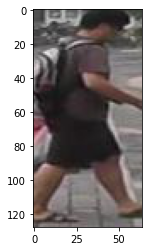

-1.1920928955078125e-07 012955.jpg


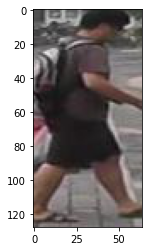

0.0790942907333374 011348.jpg


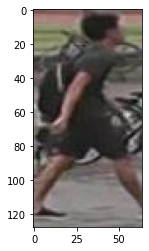

0.07910478115081787 016638.jpg


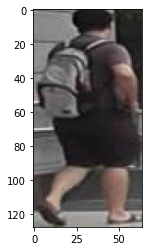

0.0852310061454773 008123.jpg


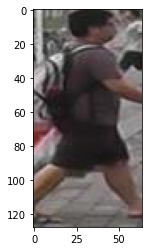

0.08731484413146973 018024.jpg


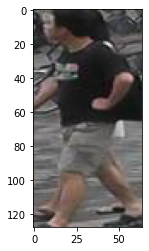

0.09336721897125244 010029.jpg


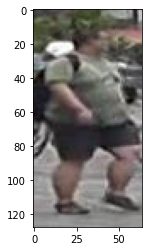

0.09345382452011108 018172.jpg


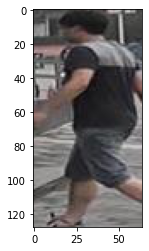

0.09361672401428223 007114.jpg


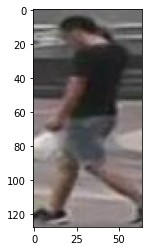

0.09439867734909058 003763.jpg


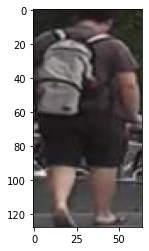

0.09604287147521973 018476.jpg


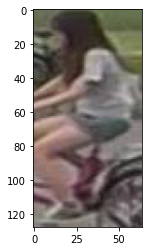

0.09983348846435547 003955.jpg


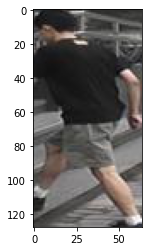

0.10028821229934692 017916.jpg


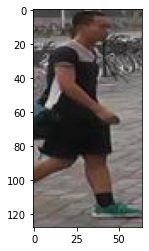

0.10048168897628784 000318.jpg


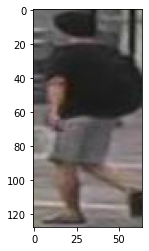

0.1012430191040039 012325.jpg


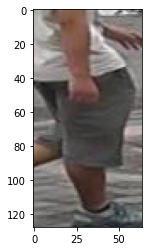

0.10213345289230347 013909.jpg


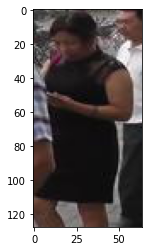

0.10292720794677734 009734.jpg


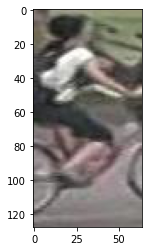

0.10293745994567871 019043.jpg


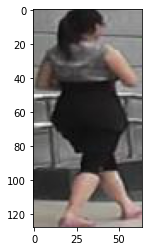

0.10318416357040405 009365.jpg


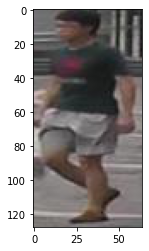

0.10327702760696411 017545.jpg


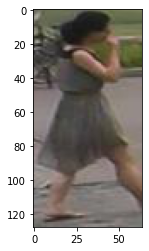

0.10422253608703613 009229.jpg


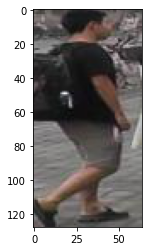

0.1042293906211853 010468.jpg


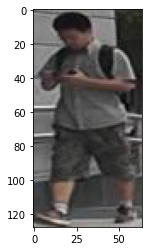

0.1042410135269165 005785.jpg


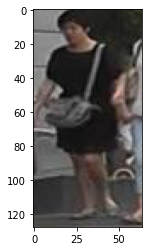

0.10464465618133545 006834.jpg


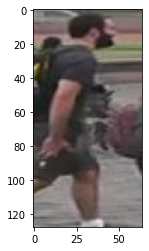

0.10506874322891235 016424.jpg


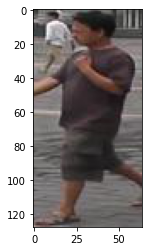

0.10612636804580688 000493.jpg


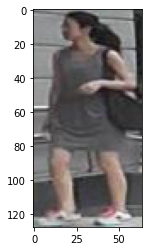

0.1063116192817688 000944.jpg


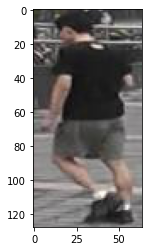

0.10681688785552979 012062.jpg


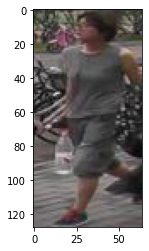

0.10794705152511597 007995.jpg


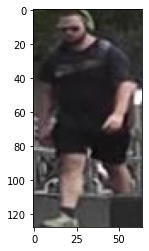

0.10812205076217651 003584.jpg


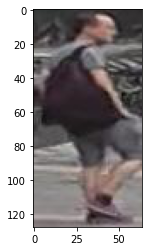

0.10871028900146484 002279.jpg


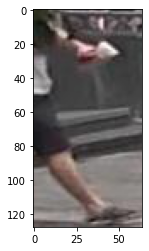

In [ ]:
img = query_img[indexes_query[query_index]]
img_transformed = img.swapaxes(0, 1)
img_transformed = img_transformed.swapaxes(1, 2)
img_transformed = img_transformed.int()
plt.imshow(img_transformed)
plt.show()
for dist, index in results[:topk]:
  img = test_img[index]
  img_transformed = img.swapaxes(0, 1)
  img_transformed = img_transformed.swapaxes(1, 2)
  img_transformed = img_transformed.int()
  print(dist.item(), index)
  plt.imshow(img_transformed)
  plt.show()

The dictionary of the predictions is computed for the test set

In [ ]:
predictions = dict()
ordered_indexes = np.argsort(distance_matrix_test.cpu(), axis=1)
for query_index, pred_order in enumerate(ordered_indexes):
  query_filename = indexes_query[query_index]
  pp = list()
  for j, p_index in enumerate(pred_order):
    if distance_matrix_test[query_index][p_index] > 0.5:
      break
    if j > 30:
      break
    pp.append(f"{indexes_test[p_index]}")
  
  predictions[f"{query_filename}"] = pp

The prediction are outputted in a txt file

In [ ]:
output_file = open("reid_test.txt", "w")
for key in predictions:
  key_predictions = predictions[key]
  output_string = ""
  for i, prediction in enumerate(key_predictions):
    if output_string:
      output_string = output_string + ", " + prediction
    else:
      output_string = prediction
  output_file.write(f"{key}: {output_string}\n")

output_file.close()